In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/resnet/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/e0604.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/y0868.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/a1012.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/c0445.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/u0030.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/r0229.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/n0503.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/za0739.png
/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/m0348.png
/kaggle/input/driver-drowsiness-dataset-d

#  **CV PROJECT**

# **DRIVER SAFETY(DROWSINESS) DETECTOR SYSTEM**

# **20k-1706**
# **20k-1721**

In [11]:
!pip install /kaggle/input/numpyy/numpy-1.22.4-pp38-pypy38_pp73-manylinux_2_17_x86_64.manylinux2014_x86_64.whl


ERROR: numpy-1.22.4-pp38-pypy38_pp73-manylinux_2_17_x86_64.manylinux2014_x86_64.whl is not a supported wheel on this platform.


In [13]:
!pip show numpy scipy


Name: numpy
Version: 1.24.3
Summary: Fundamental package for array computing in Python
Home-page: https://www.numpy.org
Author: Travis E. Oliphant et al.
Author-email: 
License: BSD-3-Clause
Location: /opt/conda/lib/python3.10/site-packages
Requires: 
Required-by: accelerate, access, albumentations, altair, apache-beam, arviz, astropy, bayesian-optimization, bayespy, biopython, blis, blosc2, bokeh, Boruta, bqplot, Cartopy, catalyst, catboost, category-encoders, cesium, cftime, chex, cleverhans, cmdstanpy, contourpy, cudf, cufflinks, cupy, CVXcanon, daal4py, dask-cuda, dask-cudf, datasets, datashader, db-dtypes, deap, easyocr, ecos, eli5, essentia, explainable-ai-sdk, fasttext, featuretools, fitter, flax, folium, fury, gensim, geoviews, ggplot, gym, gymnasium, h5py, hep-ml, hmmlearn, holoviews, hpsklearn, hyperopt, hypertools, imagecodecs, ImageHash, imageio, imbalanced-learn, imgaug, inequality, ipydatawidgets, ipyvolume, jax, jaxlib, kaggle-environments, keras-core, keras-nlp, kmapper

**Importing the Necessary Libraries**

In [19]:
from scipy.spatial.qhull import QhullError


In [20]:
import numpy as np
import tensorflow as tf
import keras
import pandas as pd
import cv2
from PIL import Image
from tqdm import tqdm

In [21]:

from skimage.io import imread
from skimage.transform import rescale
#from skimage.feature import hog
from skimage import exposure
from skimage import color
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from keras.preprocessing import image

In [22]:


from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import regularizers
from keras.models import Sequential, Model, load_model
from tensorflow.keras import callbacks
from tensorflow.keras.optimizers import Adam, Adamax
from keras.layers import Input, UpSampling2D, Conv2D, concatenate, MaxPooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization, GlobalAveragePooling2D
from keras.preprocessing.image import load_img, img_to_array
from keras.regularizers import l1, l2
from keras.src.applications import InceptionResNetV2
from keras.src.applications.inception_resnet_v2 import preprocess_input
import os
from math import ceil
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

**Creating a Combined Image Dataset with Labels**

In [23]:
import os

data_dir = "/kaggle/input/driver-drowsiness-dataset-ddd"

drowsy_df = pd.DataFrame(columns=['filepaths', 'labels'])
non_drowsy_df = pd.DataFrame(columns=['filepaths', 'labels'])

drowsy_label = 'drowsy'
non_drowsy_label = 'non_drowsy'

drowsy_files = os.listdir(os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Drowsy"))
non_drowsy_files = os.listdir(os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Non Drowsy"))

drowsy_df['filepaths'] = [os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Drowsy", filename) for filename in drowsy_files]
drowsy_df['labels'] = drowsy_label

non_drowsy_df['filepaths'] = [os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Non Drowsy", filename) for filename in non_drowsy_files]
non_drowsy_df['labels'] = non_drowsy_label


In [24]:
combined_df = pd.concat([drowsy_df, non_drowsy_df], ignore_index=True)

combined_df = combined_df.sample(frac=1, random_state=42)
label_counts = combined_df['labels'].value_counts()

label_counts

labels
drowsy        22348
non_drowsy    19445
Name: count, dtype: int64

In [25]:
combined_df.head(5)


,filepaths,labels
29183,/kaggle/input/driver-drowsiness-dataset-ddd/Dr...,non_drowsy
11257,/kaggle/input/driver-drowsiness-dataset-ddd/Dr...,drowsy
7090,/kaggle/input/driver-drowsiness-dataset-ddd/Dr...,drowsy
5987,/kaggle/input/driver-drowsiness-dataset-ddd/Dr...,drowsy
2111,/kaggle/input/driver-drowsiness-dataset-ddd/Dr...,drowsy


**Exploring Data Distribution and Visualizing Images**

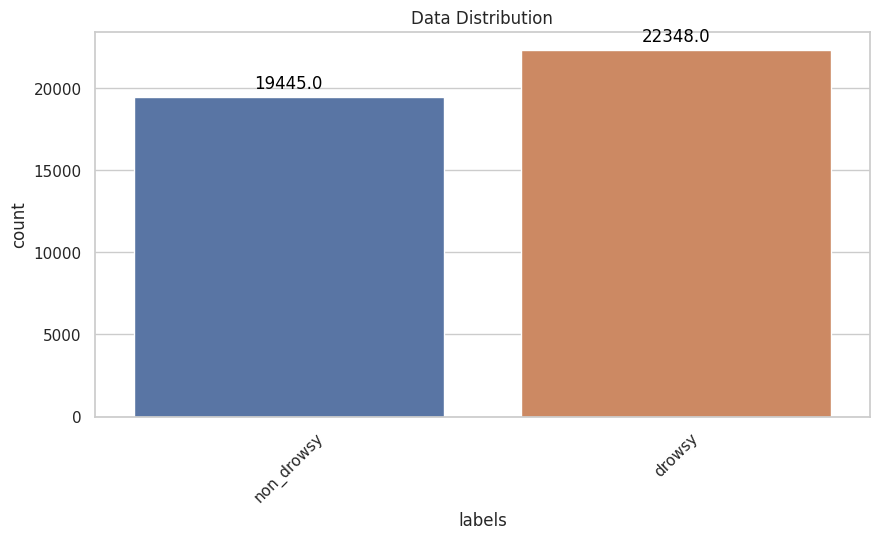

In [26]:
plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
ax = sns.countplot(data=combined_df, x='labels')
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', xytext=(0, 10), textcoords='offset points')

plt.title('Data Distribution')
plt.xticks(rotation=45)
plt.show()


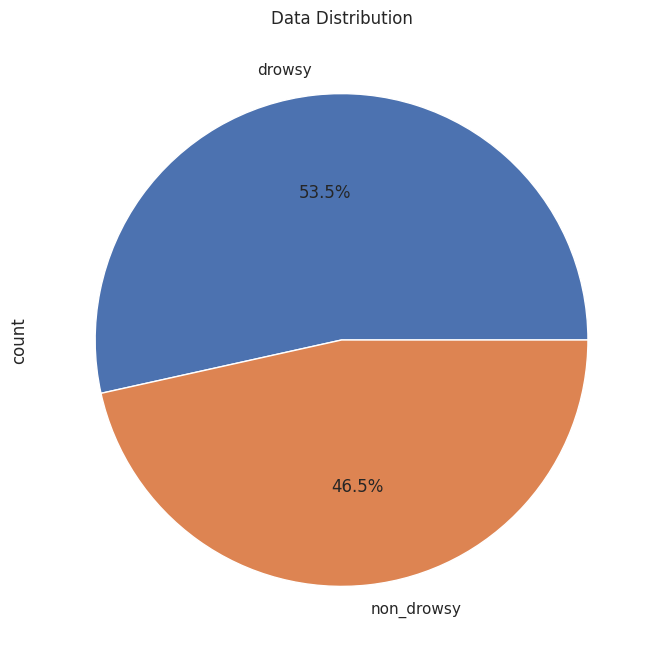

In [27]:

plt.figure(figsize=(10, 8))
combined_df['labels'].value_counts().plot.pie(autopct='%1.1f%%')
plt.title('Data Distribution')
plt.show()

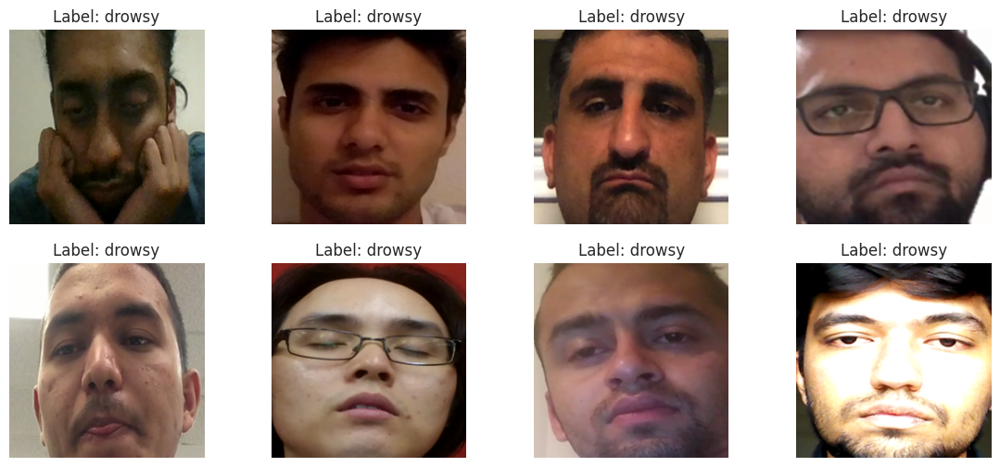

In [28]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

data_dir = "/kaggle/input/driver-drowsiness-dataset-ddd"

drowsy_df = pd.DataFrame(columns=['filepaths', 'labels'])
non_drowsy_df = pd.DataFrame(columns=['filepaths', 'labels'])

drowsy_label = 'drowsy'
non_drowsy_label = 'non_drowsy'

# Use os.listdir to get the list of files in the specified directories
drowsy_files = os.listdir(os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Drowsy"))
non_drowsy_files = os.listdir(os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Non Drowsy"))

# Update the DataFrame structure with lists of file paths
drowsy_df['filepaths'] = [os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Drowsy", filename) for filename in drowsy_files]
drowsy_df['labels'] = drowsy_label

non_drowsy_df['filepaths'] = [os.path.join(data_dir, "Driver Drowsiness Dataset (DDD)", "Non Drowsy", filename) for filename in non_drowsy_files]
non_drowsy_df['labels'] = non_drowsy_label

# Combine the two DataFrames
combined_df = pd.concat([drowsy_df, non_drowsy_df], ignore_index=True)

def display_images(df, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(14, 6))
    for r in range(rows):
        for c in range(cols):
            index = r * cols + c
            if index < len(df):
                image_path = df.iloc[index]['filepaths']
                label = df.iloc[index]['labels']
                img = Image.open(image_path)
                axes[r, c].imshow(img)
                axes[r, c].set_title(f'Label: {label}')
                axes[r, c].axis('off')
            else:
                axes[r, c].axis('off')

    plt.show()

rows = 2
cols = 4

display_images(combined_df, rows, cols)


**Data Splitting and Class Distribution in Image Dataset**

In [29]:
train_df, dummy_df = train_test_split(combined_df,  train_size= 0.8, shuffle= True, random_state= 123, stratify= combined_df['labels'])

valid_df, test_df = train_test_split(dummy_df,  train_size= 0.5, shuffle= True, random_state= 123, stratify= dummy_df['labels'])

In [30]:
train_df['labels'].value_counts()

labels
drowsy        17878
non_drowsy    15556
Name: count, dtype: int64

In [31]:
test_df['labels'].value_counts()

labels
drowsy        2235
non_drowsy    1945
Name: count, dtype: int64

In [32]:
valid_df['labels'].value_counts()

labels
drowsy        2235
non_drowsy    1944
Name: count, dtype: int64

**Data Preprocessing and Generation**


In [33]:
def scalar(img):
        return img

train_generator = ImageDataGenerator(preprocessing_function = scalar,
                                     horizontal_flip = True)

test_generator = ImageDataGenerator(preprocessing_function = scalar)

In [34]:
train_set = train_generator.flow_from_dataframe( train_df,
                                        x_col= 'filepaths',
                                        y_col= 'labels',
                                        target_size= (224, 224),
                                        class_mode= 'categorical',
                                        color_mode= 'rgb',
                                        shuffle= True,
                                        batch_size= 128)

train_set.class_indices

Found 33434 validated image filenames belonging to 2 classes.


{'drowsy': 0, 'non_drowsy': 1}

In [35]:
valid_set = test_generator.flow_from_dataframe( valid_df,
                                       x_col= 'filepaths',
                                       y_col= 'labels',
                                       target_size= (224, 224),
                                       class_mode= 'categorical',
                                       color_mode= 'rgb',
                                       shuffle= True,
                                       batch_size= 128)


Found 4179 validated image filenames belonging to 2 classes.


In [36]:
test_set = test_generator.flow_from_dataframe( test_df,
                                      x_col= 'filepaths',
                                      y_col= 'labels',
                                      target_size= (224, 224),
                                      class_mode= 'categorical',
                                      color_mode= 'rgb',
                                      shuffle= False,
                                      batch_size= 128)

Found 4180 validated image filenames belonging to 2 classes.


# **Deep Learning Models**

# **Transfer Learning(TL)**

**InceptionResNetV2-based Neural Network Architecture**

In [37]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout, GlobalMaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.regularizers import l1, l2

# Replace "your_uploaded_file_path" with the actual path where you uploaded the file
weights_path = "/kaggle/input/resnet/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5"

# Base model
base_model = InceptionResNetV2(include_top=False, weights=weights_path, input_shape=(224, 224, 3), pooling='max')

x = base_model.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)

x = Dense(256, kernel_regularizer=l2(l=0.016), activity_regularizer=l1(0.006), bias_regularizer=l1(0.006), activation='relu')(x)
x = Dropout(rate=0.3)(x)

# Change the output layer for binary classification
output = Dense(1, activation='sigmoid')(x)

# Compile the model with 'binary_crossentropy'
model = Model(inputs=base_model.input, outputs=output)
model.compile(Adamax(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 111, 111, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 111, 111, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization[0][0

In [38]:
history = model.fit(x= train_set,
                    epochs= 10,
                    verbose= 1,
                    validation_data= valid_set
)

Epoch 1/10
262/262 [==============================] - 404s 1s/step - loss: 2.9311 - accuracy: 0.5000 - val_loss: 1.2618 - val_accuracy: 0.5000
Epoch 2/10
262/262 [==============================] - 291s 1s/step - loss: 0.8931 - accuracy: 0.5000 - val_loss: 0.7586 - val_accuracy: 0.5000
Epoch 3/10
262/262 [==============================] - 291s 1s/step - loss: 0.7123 - accuracy: 0.5000 - val_loss: 0.7432 - val_accuracy: 0.5000
Epoch 4/10
262/262 [==============================] - 292s 1s/step - loss: 0.6961 - accuracy: 0.5000 - val_loss: 1.2142 - val_accuracy: 0.5000
Epoch 5/10
262/262 [==============================] - 292s 1s/step - loss: 0.6961 - accuracy: 0.5000 - val_loss: 0.6952 - val_accuracy: 0.5000
Epoch 6/10
262/262 [==============================] - 292s 1s/step - loss: 0.6945 - accuracy: 0.5000 - val_loss: 0.6938 - val_accuracy: 0.5000
Epoch 7/10
262/262 [==============================] - 291s 1s/step - loss: 0.6944 - accuracy: 0.5000 - val_loss: 0.6936 - val_accuracy: 0.5000

**Training and Validation Performance Visualization**

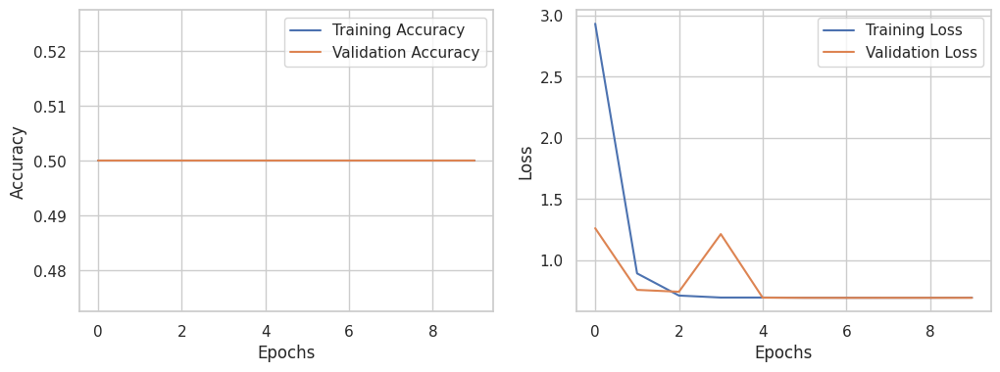

In [39]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

**Model Evaluation and Image Prediction**

In [40]:
model.save("Drowsy_InceptionResntV2.h5")

In [43]:
model = load_model("/kaggle/working/Drowsy_InceptionResntV2.h5")

In [44]:
train_results = model.evaluate(train_set, verbose= 1)
valid_results = model.evaluate(valid_set, verbose= 1)
test_results = model.evaluate(test_set, verbose= 1)

print("\nTrain Loss: ", train_results[0])
print("Train Accuracy: ", train_results[1])
print('-' * 40)

print("Validation Loss: ", valid_results[0])
print("Validation Accuracy: ", valid_results[1])
print('-' * 40)

print("Test Loss: ", test_results[0])
print("Test Accuracy: ", test_results[1])

33/33 [==============================] - 38s 1s/step - loss: 0.6939 - accuracy: 0.5000

Train Loss:  0.6938573718070984
Train Accuracy:  0.5
----------------------------------------
Validation Loss:  0.6938552856445312
Validation Accuracy:  0.5
----------------------------------------
Test Loss:  0.6938552856445312
Test Accuracy:  0.5


In [45]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict_generator(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

33/33 [==============================] - 22s 557ms/step
Classification Report:
               precision    recall  f1-score   support

      drowsy       0.53      1.00      0.70      2235
  non_drowsy       0.00      0.00      0.00      1945

    accuracy                           0.53      4180
   macro avg       0.27      0.50      0.35      4180
weighted avg       0.29      0.53      0.37      4180



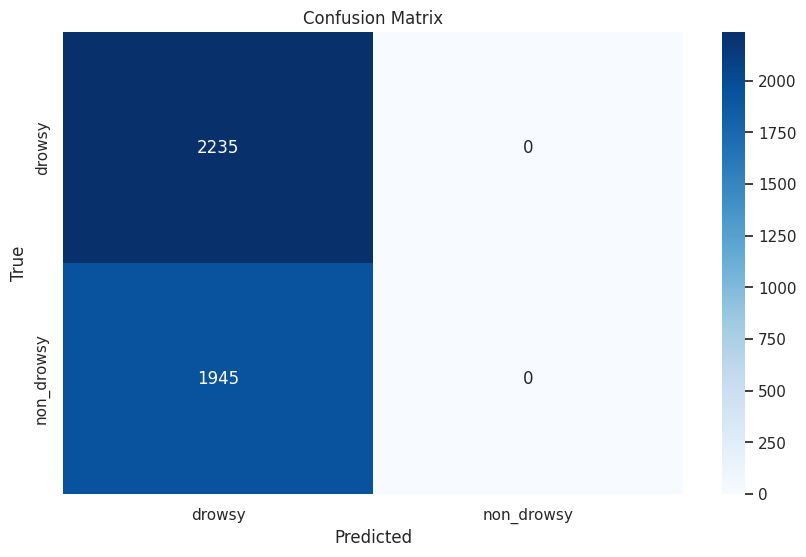

In [46]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 38ms/step


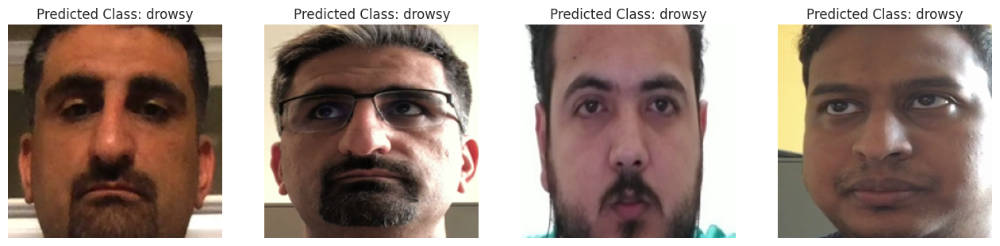

In [47]:
def predict_and_display_images(image_paths, model):
    class_labels = ['drowsy', 'non_drowsy']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

image_paths = [
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/A0003.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/a0012.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/F0093.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/b0500.png'
]


predict_and_display_images(image_paths, model)

**Activation Map Visualization and Attention Map Generation**


1/1 [==============================] - 0s 52ms/step


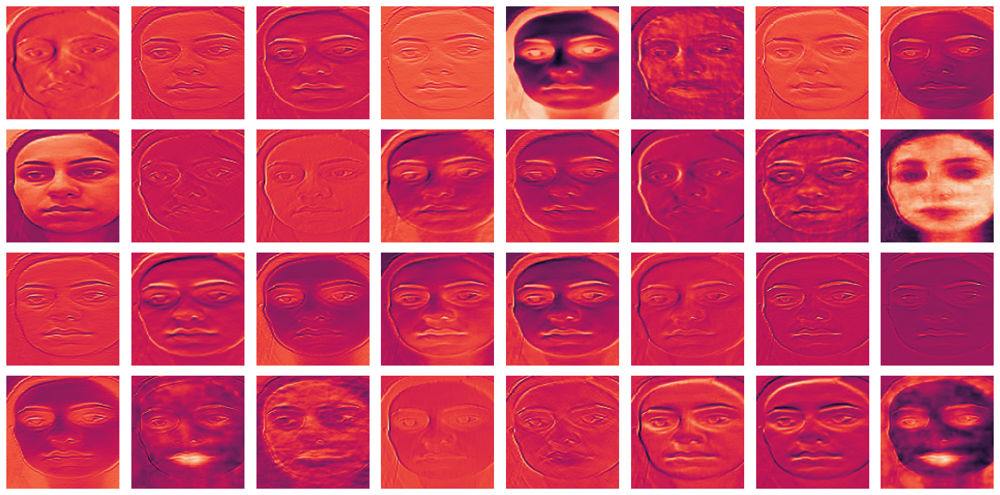

In [48]:
def visualize_activation_maps(model, img_path, layer_name):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

    activations = intermediate_model.predict(img_array)

    num_filters = activations.shape[-1]
    rows = int(np.ceil(num_filters / 8))

    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))

    for i in range(rows):
        for j in range(8):
            if i*8 + j < num_filters:
                axs[i, j].imshow(activations[0, :, :, i*8 + j])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

layer_name = 'conv2d_1'
img_path = '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/G0011.png'

visualize_activation_maps(model, img_path, layer_name)

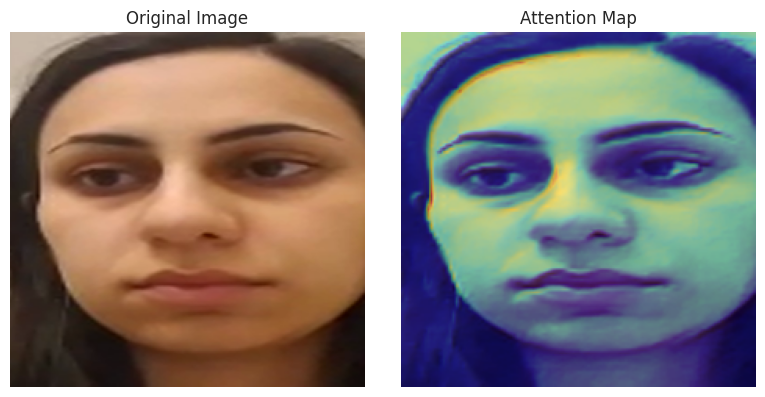

In [49]:
def get_gradcam(model, img_array, layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    img = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/G0011.png'
img = load_img(image_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

layer_name = 'conv2d'
heatmap = get_gradcam(model, img_array, layer_name)

visualize_attention(image_path, heatmap)

# **Convolutional Neural Network(CNN)**

**Convolutional Neural Network with Parallel Convolution Architecture**

In [50]:
def parallel_convolution_blocks(x, filters):
    conv1x1 = Conv2D(filters[0], (1, 1), padding='same', activation='relu')(x)

    conv1x1_3x3 = Conv2D(filters[1], (1, 1), padding='same', activation='relu')(x)
    conv3x3 = Conv2D(filters[2], (3, 3), padding='same', activation='relu')(conv1x1_3x3)

    conv1x1_5x5 = Conv2D(filters[3], (1, 1), padding='same', activation='relu')(x)
    conv5x5 = Conv2D(filters[4], (5, 5), padding='same', activation='relu')(conv1x1_5x5)

    maxpool = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    conv1x1_maxpool = Conv2D(filters[5], (1, 1), padding='same', activation='relu')(maxpool)

    feature_fusion = concatenate([conv1x1, conv3x3, conv5x5, conv1x1_maxpool], axis=-1)
    return feature_fusion

input = Input(shape=(224, 224, 3))
x = input

x = Conv2D(64, (7, 7), strides=(2, 2), padding='same', activation='relu')(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [64, 128, 128, 32, 32, 32])
x = parallel_convolution_blocks(x, [128, 192, 96, 64, 64, 64])
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [32, 64, 64, 16, 16, 32])
x = parallel_convolution_blocks(x, [64, 192, 128, 64, 64, 32])
x = MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

x = parallel_convolution_blocks(x, [64, 128, 128, 32, 32, 32])
x = parallel_convolution_blocks(x, [128, 192, 96, 128, 128, 128])
x = MaxPooling2D((3, 3), strides=(2, 2), padding='same')(x)

x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

output = Dense(2, activation='softmax')(x)

model = Model(input, output)

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_203 (Conv2D)         (None, 112, 112, 64)         9472      ['input_2[0][0]']             
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 56, 56, 64)           0         ['conv2d_203[0][0]']          
 g2D)                                                                                             
                                                                                                  
 conv2d_205 (Conv2D)         (None, 56, 56, 128)          8320      ['max_pooling2d_4[0][0]'

**Training the Model**

In [51]:
checkpoint_callback = callbacks.ModelCheckpoint(
    filepath = 'Drowsy_CNN_with_Parallel_Convolution.h5',
    monitor = 'val_accuracy',
    save_best_only = True,
    mode = 'max',
    verbose = 1
)

In [52]:
history = model.fit(
    train_set,
    validation_data = valid_set,
    epochs = 10,
    callbacks = [checkpoint_callback],
    verbose = 1
)

Epoch 1/10
262/262 [==============================] - ETA: 0s - loss: 1.0196 - accuracy: 0.5392
Epoch 1: val_accuracy improved from -inf to 0.59057, saving model to Drowsy_CNN_with_Parallel_Convolution.h5
262/262 [==============================] - 195s 666ms/step - loss: 1.0196 - accuracy: 0.5392 - val_loss: 535.0382 - val_accuracy: 0.5906
Epoch 2/10
262/262 [==============================] - ETA: 0s - loss: 55.5198 - accuracy: 0.6300
Epoch 2: val_accuracy did not improve from 0.59057
262/262 [==============================] - 176s 670ms/step - loss: 55.5198 - accuracy: 0.6300 - val_loss: 17.9381 - val_accuracy: 0.5351
Epoch 3/10
262/262 [==============================] - ETA: 0s - loss: 16.2846 - accuracy: 0.5857
Epoch 3: val_accuracy did not improve from 0.59057
262/262 [==============================] - 170s 646ms/step - loss: 16.2846 - accuracy: 0.5857 - val_loss: 29158.4512 - val_accuracy: 0.5403
Epoch 4/10
262/262 [==============================] - ETA: 0s - loss: 930.3048 - accu

**Training and Validation Performance Visualization**

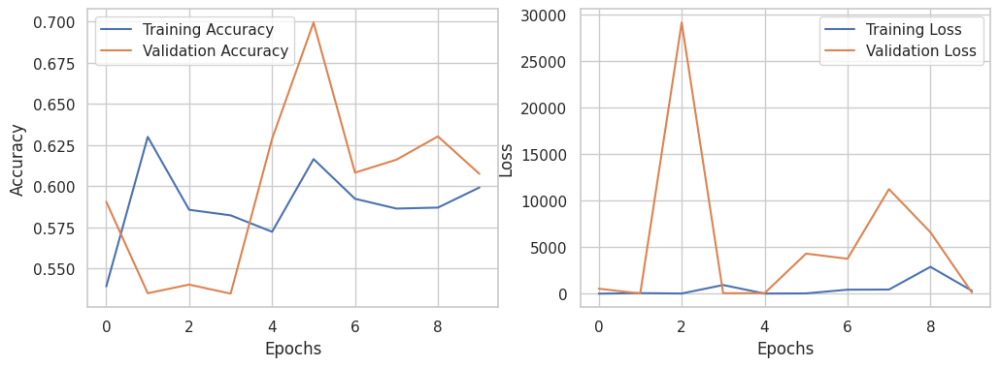

In [53]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

**Model Evaluation and Image Prediction**

In [55]:
model = load_model("Drowsy_CNN_with_Parallel_Convolution.h5")

In [57]:
train_results = model.evaluate(train_set, verbose= 1)
valid_results = model.evaluate(valid_set, verbose= 1)
test_results = model.evaluate(test_set, verbose= 1)

print("\nTrain Loss: ", train_results[0])
print("Train Accuracy: ", train_results[1])
print('-' * 40)

print("Validation Loss: ", valid_results[0])
print("Validation Accuracy: ", valid_results[1])
print('-' * 40)

print("Test Loss: ", test_results[0])
print("Test Accuracy: ", test_results[1])

33/33 [==============================] - 24s 727ms/step - loss: 5111.4941 - accuracy: 0.6789

Train Loss:  544.372802734375
Train Accuracy:  0.690285325050354
----------------------------------------
Validation Loss:  4347.02783203125
Validation Accuracy:  0.6980139017105103
----------------------------------------
Test Loss:  5111.494140625
Test Accuracy:  0.678947389125824


In [58]:
class_names = list(test_set.class_indices.keys())

predictions = model.predict_generator(test_set, verbose=1)
predicted_labels = np.argmax(predictions, axis=1)

true_labels = test_set.classes

class_report = classification_report(true_labels, predicted_labels, target_names = class_names)
print("Classification Report:\n", class_report)

33/33 [==============================] - 18s 545ms/step
Classification Report:
               precision    recall  f1-score   support

      drowsy       0.68      0.76      0.72      2235
  non_drowsy       0.68      0.59      0.63      1945

    accuracy                           0.68      4180
   macro avg       0.68      0.67      0.67      4180
weighted avg       0.68      0.68      0.68      4180



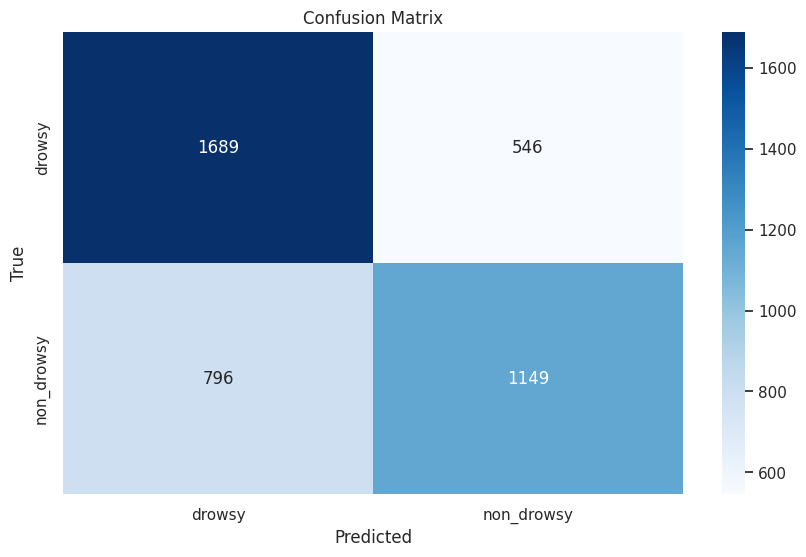

In [59]:
confusion_mat = confusion_matrix(true_labels, predicted_labels)

plt.figure(figsize=(10, 6))
sns.heatmap(confusion_mat, annot = True, fmt = "d", cmap = "Blues", xticklabels = class_names, yticklabels = class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

1/1 [==============================] - 0s 24ms/step


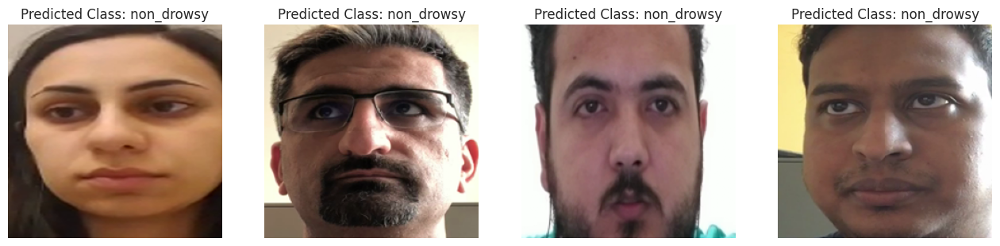

In [60]:
def predict_and_display_images(image_paths, model):
    class_labels = ['drowsy', 'non_drowsy']

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    for i, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis=0)
        predictions = model.predict(img)
        predicted_class_index = np.argmax(predictions, axis=1)[0]
        predicted_class = class_labels[predicted_class_index]

        ax = axes[i]
        ax.imshow(img[0] / 255.0)
        ax.set_title(f"Predicted Class: {predicted_class}")
        ax.axis('off')

    plt.show()

image_paths = [
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/G0011.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/a0012.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/F0093.png',
    '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Non Drowsy/b0500.png'
]


predict_and_display_images(image_paths, model)

**Activation Map Visualization and Attention Map Generation**

1/1 [==============================] - 0s 48ms/step


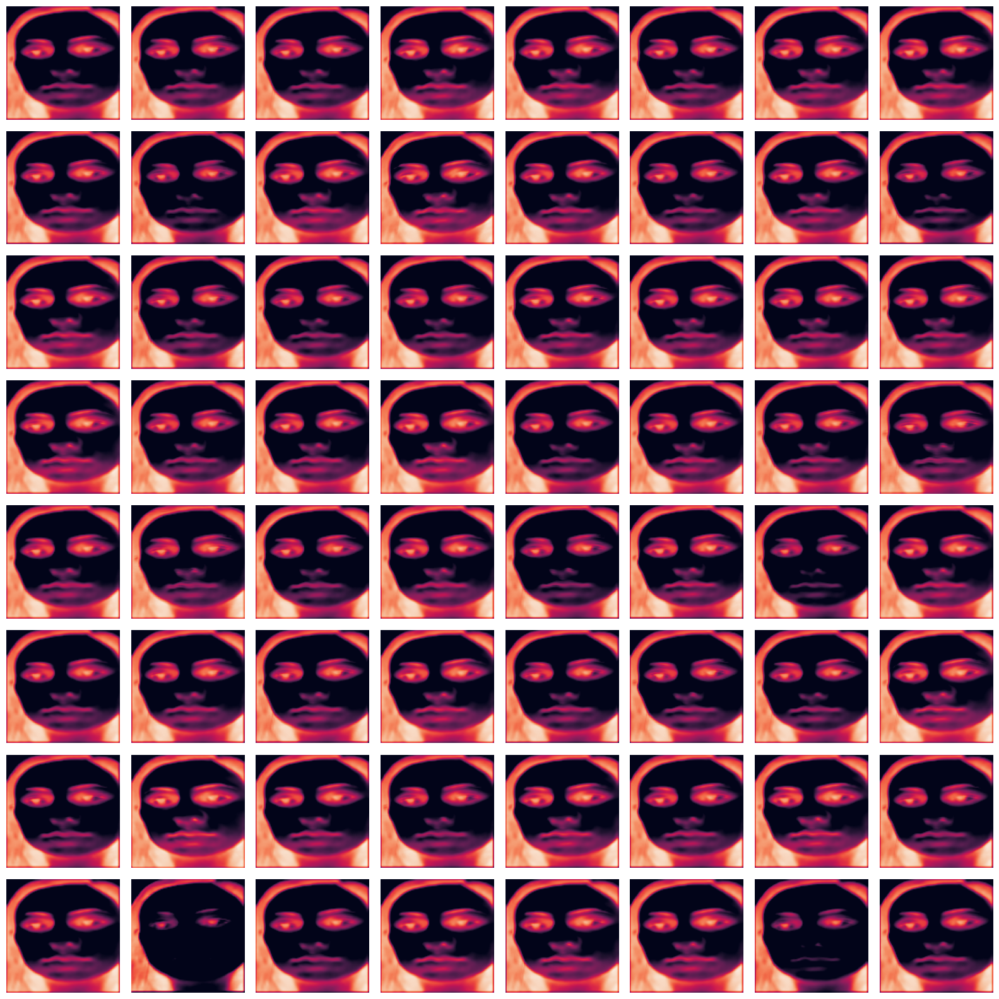

In [64]:
def visualize_activation_maps(model, img_path, layer_name):
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    intermediate_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

    activations = intermediate_model.predict(img_array)

    num_filters = activations.shape[-1]
    rows = int(np.ceil(num_filters / 8))

    fig, axs = plt.subplots(nrows=rows, ncols=8, figsize=(16, rows*2))

    for i in range(rows):
        for j in range(8):
            if i*8 + j < num_filters:
                axs[i, j].imshow(activations[0, :, :, i*8 + j])
                axs[i, j].axis('off')

    plt.tight_layout()
    plt.show()

layer_name = 'conv2d_203'
img_path = '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/G0011.png'

visualize_activation_maps(model, img_path, layer_name)


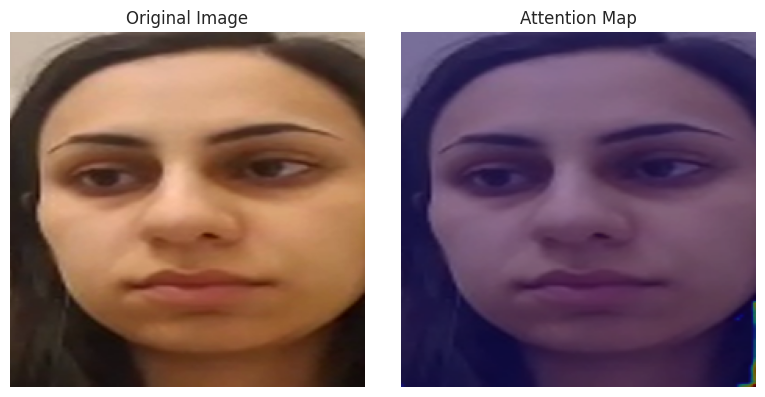

In [66]:
def get_gradcam(model, img_array, layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    return heatmap

def visualize_attention(image_path, heatmap):
    img = cv2.imread(image_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB))
    plt.title('Attention Map')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

image_path = '/kaggle/input/driver-drowsiness-dataset-ddd/Driver Drowsiness Dataset (DDD)/Drowsy/G0011.png'
img = load_img(image_path, target_size=(224, 224))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array /= 255.0

layer_name = 'conv2d_203'
heatmap = get_gradcam(model, img_array, layer_name)

visualize_attention(image_path, heatmap)